# 사고 이미지 시각화
- circle dectection 사용 안하고, 그냥 사고지점 원 그림 그대로 사용해서 overlap

In [1]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

# 시각화 테스트

In [2]:
img = plt.imread("./data/bg_img/광명시1_1000m.png") # 배경 이미지
img.shape

(1211, 1760, 4)

In [3]:
img_point = plt.imread("./figs/전체/20231201_20231231.png")

# 검은색 박스 제거
mask = np.logical_and(img_point[:, :, 3] > 0.01, np.sum(img_point[:, :, :3],axis=2) < 0.5)
#mask = np.expand_dims(mask, axis=2)
img_point[mask] = (0., 0., 0., 0.,)

# 색상 통일, 점 크기 키우기
img_point[:, :, 0] = img_point[:, :, 3]
img_point[:, :, 1] = 0.0
img_point[:, :, 2] = 0.0


gray_img = cv2.cvtColor(img_point, cv2.COLOR_RGBA2GRAY)
gray_img = (255.0 * gray_img).astype(np.uint8)

contour, _ = cv2.findContours(gray_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
img_point = cv2.drawContours(img_point, contour, -1, color=(1., 0., 0., 1.,), thickness=12)

In [4]:
img_point.shape

(2662, 4535, 4)

In [8]:
rate = img.shape[0]/img_point.shape[0]
new_h = int(img_point.shape[0] * rate)
new_w = int(img_point.shape[1] * rate)

resized = cv2.resize(img_point, dsize=(new_w, new_h))
crop_x = (new_w-img.shape[1])//2
resized = resized[:, crop_x:crop_x+img.shape[1]]
wrap_w = 30
wrap_h = 21
scale_rate = 0.965
M = np.float32([[scale_rate, 0, wrap_w],
                [0, scale_rate, wrap_h]])
resized_shifted = cv2.warpAffine(resized, M, (resized.shape[1], resized.shape[0]))

In [47]:
resized.shape

(1211, 1760, 4)

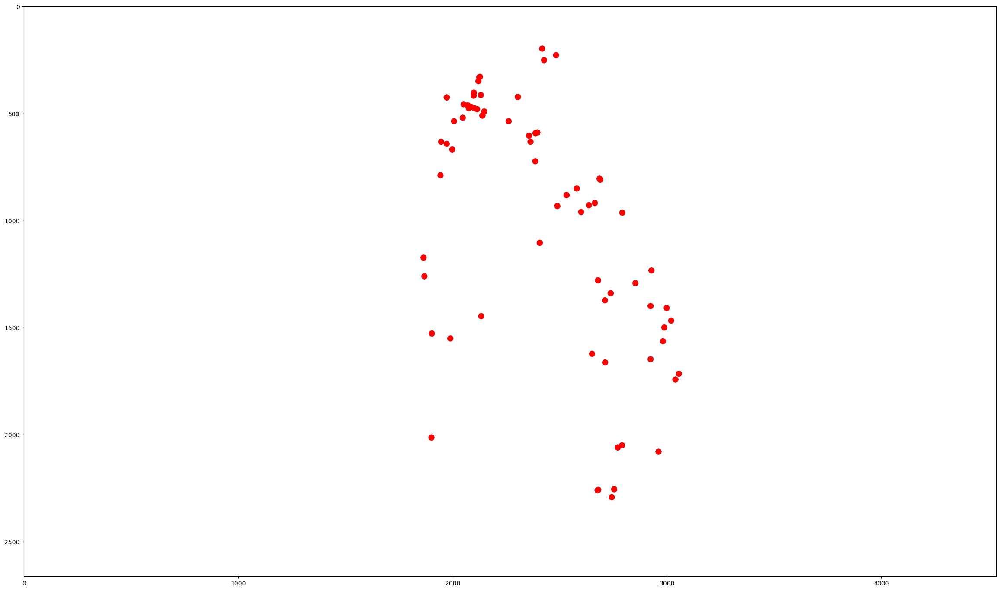

In [102]:
plt.figure(figsize=(29, 20))

plt.imshow(img_point)
plt.show()

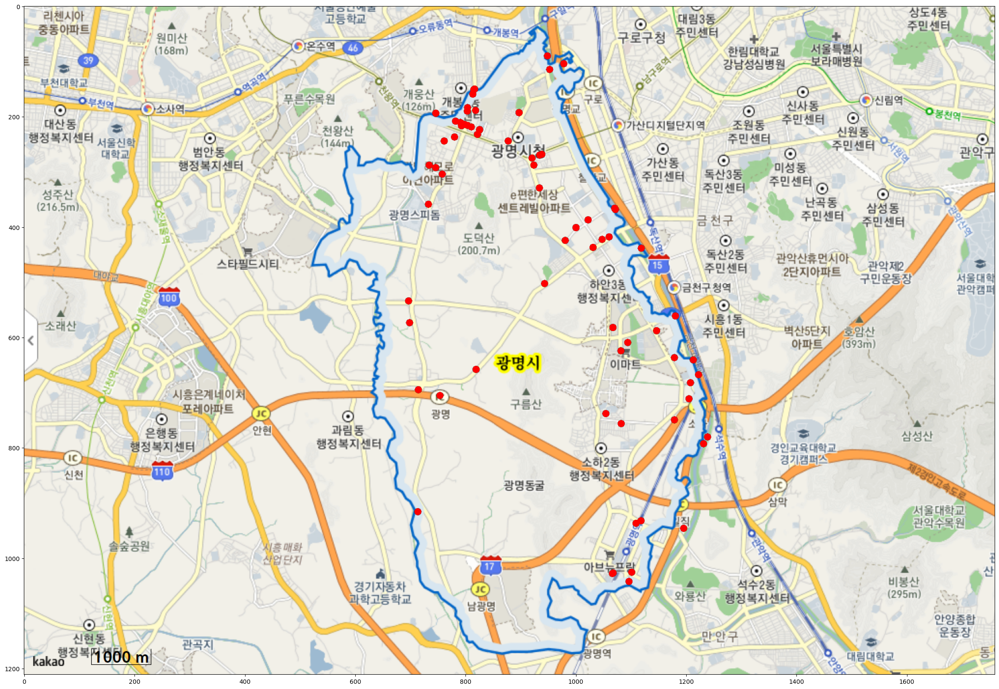

In [9]:
plt.figure(figsize=(29, 20))

plt.imshow(img)
plt.imshow(resized)
plt.show()

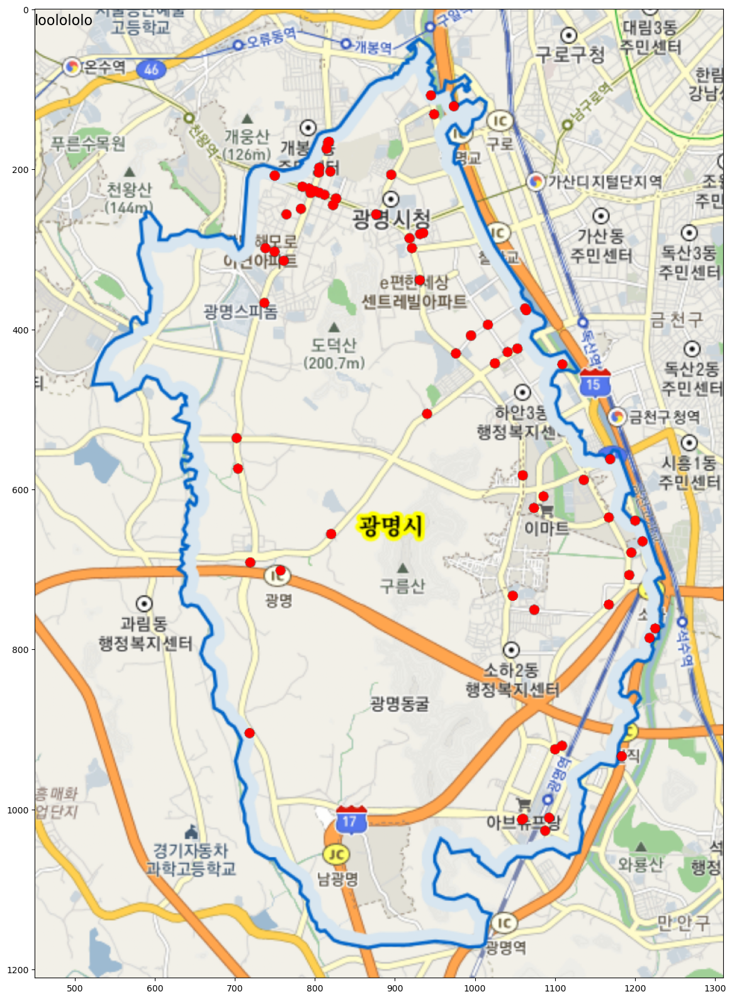

In [ ]:
plt.figure(figsize=(29, 20))

plt.imshow(img)
plt.imshow(resized_shifted)
clip_x = 450
plt.xlim([clip_x, img.shape[1]-clip_x])
plt.text(clip_x+5, 5, "loolololo", fontsize=16, ha="left",va="top")
plt.show()

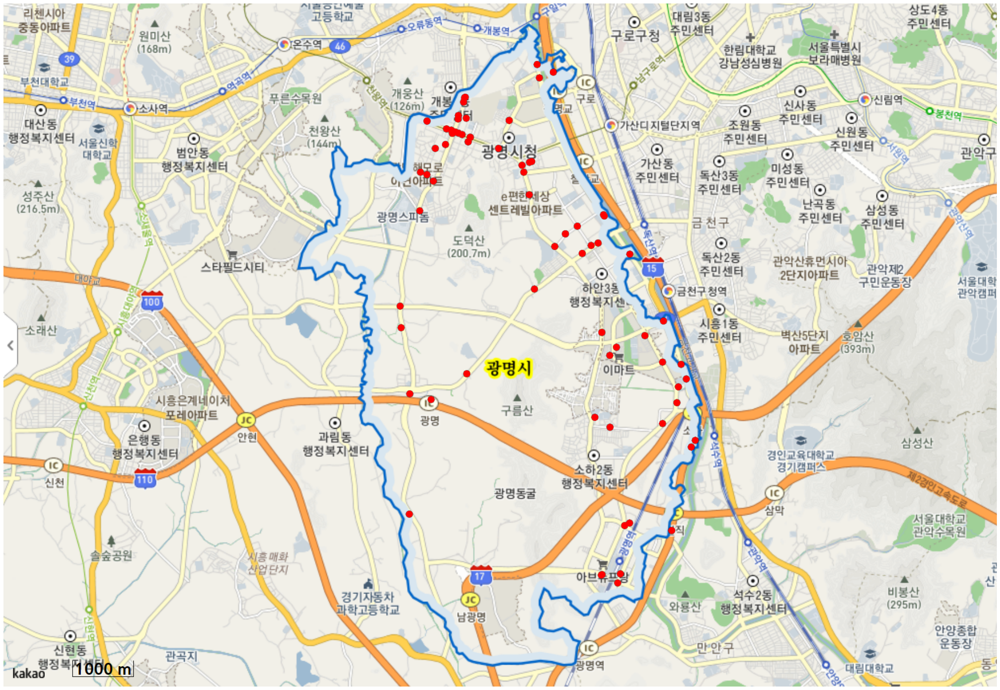

In [21]:
plt.figure(figsize=(29, 20))

plt.imshow(img)
plt.imshow(resized_shifted)
plt.axis("off")
plt.tight_layout()
plt.show()


# 이미지 시간대별로 저장 (gif 생성용)

In [3]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
import glob
import cv2

In [ ]:
file_list = glob.glob("figs/전체/*png")
file_list.sort()
file_list

background = plt.imread("./data/bg_img/광명시1_1000m.png")[:, :, :3]

# 색조-채도-명조로 변환
hsvImage = cv2.cvtColor(background , cv2.COLOR_RGB2HSV)
# 채도 낮추기
hsvImage[:, :, 1] *= 0.4
# 역변환
background = cv2.cvtColor(hsvImage, cv2.COLOR_HSV2RGB)

# point image adjustment param
wrap_w = 30
wrap_h = 21
scale_rate = 0.965
M = np.float32([[scale_rate, 0, wrap_w],
                [0, scale_rate, wrap_h]])

# view param
clip_x = 450

# animation param
start_at = 0
frames = abs(start_at) if start_at < 0 else len(file_list)-start_at
interval = 30000//frames
mp4_name = "광명시_07년_23년_교통사고.mp4"

fig = plt.figure(figsize=(9, 12))

def animate(i):
    file_name = file_list[start_at+i]
    timelabel = file_name.split("_")[-1].split(".")[0]
    timelabel = f"{timelabel[:4]}-{timelabel[4:6]}"
    img_point = plt.imread(file_name)
    # 검은색 박스 제거
    mask = np.logical_and(img_point[:, :, 3] > 0.01, np.sum(img_point[:, :, :3],axis=2) < 0.5)
    #mask = np.expand_dims(mask, axis=2)
    img_point[mask] = (0., 0., 0., 0.,)

    # 색상 통일, 점 크기 키우기
    img_point[:, :, 0] = img_point[:, :, 3]
    img_point[:, :, 1] = 0.0
    img_point[:, :, 2] = 0.0

    gray_img = cv2.cvtColor(img_point, cv2.COLOR_RGBA2GRAY)
    gray_img = (255.0 * gray_img).astype(np.uint8)

    contour, _ = cv2.findContours(gray_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    img_point = cv2.drawContours(img_point, contour, -1, color=(1., 0., 0., 1.,), thickness=35)

    rate = background.shape[0]/img_point.shape[0]
    new_h = int(img_point.shape[0] * rate)
    new_w = int(img_point.shape[1] * rate)

    resized = cv2.resize(img_point, dsize=(new_w, new_h))
    crop_x = (new_w-background.shape[1])//2
    resized = resized[:, crop_x:crop_x+background.shape[1]]

    resized_shifted = cv2.warpAffine(resized, M, (resized.shape[1], resized.shape[0]))
    plt.cla()

    
    plt.imshow(background)
    plt.imshow(resized_shifted)
    plt.axis("off")


    plt.xlim([clip_x, background.shape[1]-clip_x])
    plt.text(clip_x+15, 15, timelabel, fontsize=70, ha="left",va="top",ma="center",linespacing=0.5,
                bbox = {"boxstyle": "round,pad=0.05,rounding_size=0.15", "ec":(1.0,1.0,1.0,1.0),"fc":(1.0,1.0,1.0,0.8)})
    plt.tight_layout()
    
anim = FuncAnimation(fig, animate, frames=frames, interval=interval)

anim.save(mp4_name)
